## Initial Imports and Setup:

In [17]:
import numpy as np
import pandas as pd
import tensorflow as tf
from keras import layers
from keras.models import Model
from keras.applications import EfficientNetB0
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
from collections import Counter
import os 

print("TensorFlow version:", tf.__version__)
print("All imports successful!")

TensorFlow version: 2.13.0
All imports successful!


In [18]:
# Set random seeds for reproducibility
tf.random.set_seed(42)
np.random.seed(42)

# Configuration
IMG_SIZE = 244  # Your preprocessed image size
BATCH_SIZE = 16  # Adjusted for CPU
EPOCHS = 30
NUM_CLASSES = 5
AUTOTUNE = tf.data.AUTOTUNE

# Define paths
BASE_DIR = '/Users/susheel/Desktop/Diabetic-Retinopathy-Detection-in-Fundus-Images'
IMAGE_DIR = os.path.join(BASE_DIR, 'resize_images')

# Create class mapping
class_mapping = {
    'No disease': 0,
    'Mild': 1,
    'Moderate': 2,
    'Severe': 3,
    'Proliferate': 4
}

print("Setup Complete!")

Setup Complete!


## Recreate the filtered_labels_dict from your preprocessed CSV:

In [19]:
# Load original labels
labels_path = '/Users/susheel/Downloads/Diabetic Retinopathy archive/trainLabels.csv'
labels_df = pd.read_csv(labels_path)

# Map descriptions
label_descriptions = {
    0: "No disease",
    1: "Mild",
    2: "Moderate",
    3: "Severe",
    4: "Proliferate"
}
labels_df['description'] = labels_df['level'].map(label_descriptions)

# Create labels dictionary
labels_dict = dict(zip(labels_df['image'], labels_df['description']))

# Get list of actual images in your preprocessed directory
existing_images = [f.replace('.jpeg', '') for f in os.listdir(IMAGE_DIR) if f.endswith('.jpeg')]

# Create filtered dictionary only for images that exist in your preprocessed folder
filtered_labels_dict = {img: labels_dict[img] for img in existing_images if img in labels_dict}

print("Labels loaded!")
print("\nDistribution of classes:")
print(Counter(filtered_labels_dict.values()))

Labels loaded!

Distribution of classes:
Counter({'No disease': 10810, 'Moderate': 5292, 'Mild': 2443, 'Severe': 873, 'Proliferate': 708})


## Create Dataset Pipleine:

In [20]:
def preprocess_image(image_path):
    """
    Load and preprocess image with improved normalization
    """
    img = tf.io.read_file(image_path)
    img = tf.image.decode_jpeg(img, channels=3)
    img = tf.cast(img, tf.float32) / 255.0
    # Add additional preprocessing
    img = tf.image.per_image_standardization(img)
    return img

def create_dataset(image_paths, labels, is_training=True):
    """
    Create an optimized dataset pipeline with improved buffering
    """
    dataset = tf.data.Dataset.from_tensor_slices((image_paths, labels))
    
    if is_training:
        dataset = dataset.shuffle(buffer_size=2048)  # Increased buffer size
    
    dataset = dataset.map(lambda x, y: (preprocess_image(x), y), 
                         num_parallel_calls=AUTOTUNE)
    
    dataset = dataset.batch(BATCH_SIZE)
    dataset = dataset.prefetch(AUTOTUNE)
    
    return dataset

# Create image paths and labels
image_paths = []
labels = []

for image_name, label in filtered_labels_dict.items():
    image_path = os.path.join(IMAGE_DIR, f"{image_name}.jpeg")
    if os.path.exists(image_path):
        image_paths.append(image_path)
        labels.append(class_mapping[label])

image_paths = np.array(image_paths)
labels = np.array(labels)

# Split with stratification
train_paths, val_paths, train_labels, val_labels = train_test_split(
    image_paths, labels, test_size=0.2, random_state=42, stratify=labels
)

# Create datasets
train_dataset = create_dataset(train_paths, train_labels, is_training=True)
val_dataset = create_dataset(val_paths, val_labels, is_training=False)

print("Datasets created!")
print(f"Training samples: {len(train_paths)}")
print(f"Validation samples: {len(val_paths)}")

Datasets created!
Training samples: 16100
Validation samples: 4026


## Create Model

In [21]:
# Enhanced data augmentation
data_augmentation = tf.keras.Sequential([
    layers.RandomRotation(0.2),
    layers.RandomFlip("horizontal"),
    layers.RandomFlip("vertical"),
    layers.RandomBrightness(0.3),
    layers.RandomContrast(0.3),
    layers.RandomZoom(0.2),
    layers.GaussianNoise(0.1)
])

def build_model():
    """
    Create EfficientNet model with improved architecture
    """
    base_model = EfficientNetB0(
        include_top=False,
        weights='imagenet',
        input_shape=(IMG_SIZE, IMG_SIZE, 3)
    )
    
    # Unfreeze some layers for fine-tuning
    for layer in base_model.layers[-20:]:
        layer.trainable = True
    
    inputs = layers.Input(shape=(IMG_SIZE, IMG_SIZE, 3))
    x = data_augmentation(inputs)
    
    # Add batch normalization
    x = layers.BatchNormalization()(x)
    
    x = base_model(x)
    x = layers.GlobalAveragePooling2D()(x)
    
    # Add more complexity to top layers
    x = layers.Dense(512, activation='relu')(x)
    x = layers.BatchNormalization()(x)
    x = layers.Dropout(0.3)(x)
    
    x = layers.Dense(256, activation='relu')(x)
    x = layers.BatchNormalization()(x)
    x = layers.Dropout(0.3)(x)
    
    outputs = layers.Dense(NUM_CLASSES, activation='softmax')(x)
    
    model = Model(inputs, outputs)
    return model

# Build and compile model with reduced learning rate
model = build_model()
model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-5),  # Reduced learning rate
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

print("Model compiled!")
model.summary()

Model compiled!
Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_6 (InputLayer)        [(None, 244, 244, 3)]     0         
                                                                 
 sequential_2 (Sequential)   (None, 244, 244, 3)       0         
                                                                 
 batch_normalization_3 (Bat  (None, 244, 244, 3)       12        
 chNormalization)                                                
                                                                 
 efficientnetb0 (Functional  (None, 8, 8, 1280)        4049571   
 )                                                               
                                                                 
 global_average_pooling2d_2  (None, 1280)              0         
  (GlobalAveragePooling2D)                                       
                                           

## Train Model:

In [22]:
%%capture
# Calculate balanced class weights
total_samples = len(labels)
n_samples = np.bincount(labels)
class_weights = {}
for i in range(NUM_CLASSES):
    class_weights[i] = total_samples / (NUM_CLASSES * n_samples[i])

# Enhanced callbacks
callbacks = [
    tf.keras.callbacks.EarlyStopping(
        monitor='val_loss', 
        patience=10,  # Increased patience
        restore_best_weights=True,
        min_delta=0.001  # Minimum change to qualify as an improvement
    ),
    tf.keras.callbacks.ReduceLROnPlateau(
        monitor='val_loss',
        factor=0.2,
        patience=5,
        min_lr=1e-7,
        verbose=1
    ),
    tf.keras.callbacks.ModelCheckpoint(
        'best_model.h5',
        monitor='val_accuracy',
        save_best_only=True,
        verbose=1
    )
]

# Train with class weights
history = model.fit(
    train_dataset,
    validation_data=val_dataset,
    epochs=EPOCHS,
    callbacks=callbacks,
    class_weight=class_weights,
    verbose=1
)

2024-11-11 17:45:29.536545: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-11-11 17:45:30.560353: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-11-11 17:45:30.560530: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-11-11 17:45:30.560684: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-11-11 17:45:33.416574: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-11-11 17:45:33.416586: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-11-11

## Plot Results:

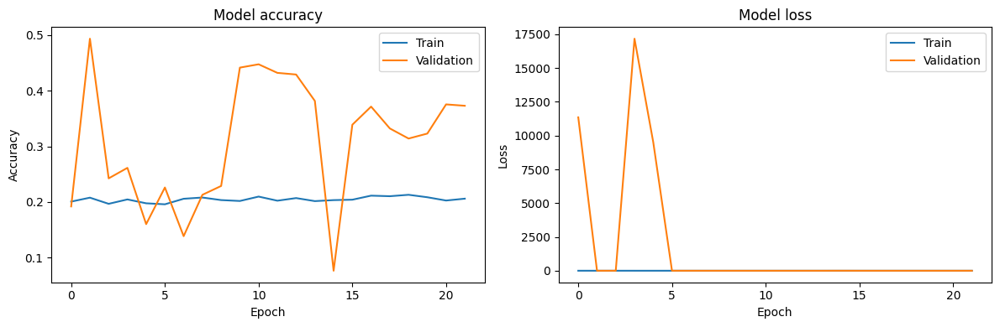

In [23]:
def plot_training_history(history):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))
    
    # Plot accuracy
    ax1.plot(history.history['accuracy'])
    ax1.plot(history.history['val_accuracy'])
    ax1.set_title('Model accuracy')
    ax1.set_xlabel('Epoch')
    ax1.set_ylabel('Accuracy')
    ax1.legend(['Train', 'Validation'])
    
    # Plot loss
    ax2.plot(history.history['loss'])
    ax2.plot(history.history['val_loss'])
    ax2.set_title('Model loss')
    ax2.set_xlabel('Epoch')
    ax2.set_ylabel('Loss')
    ax2.legend(['Train', 'Validation'])
    
    plt.tight_layout()
    plt.show()

plot_training_history(history)

## Save Model:

In [ ]:
# Save the trained model
model.save('diabetic_retinopathy_model.h5')
print("Model saved successfully!")

## Print Evaluation Metrics:

2024-11-11 20:28:06.438487: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


252/252 [==============================] - 16s 56ms/step

Classification Report:
              precision    recall  f1-score   support

  No disease       0.56      0.70      0.62      2162
        Mild       0.14      0.04      0.07       489
    Moderate       0.27      0.15      0.20      1058
      Severe       0.08      0.27      0.12       175
 Proliferate       0.20      0.02      0.04       142

    accuracy                           0.43      4026
   macro avg       0.25      0.24      0.21      4026
weighted avg       0.40      0.43      0.40      4026



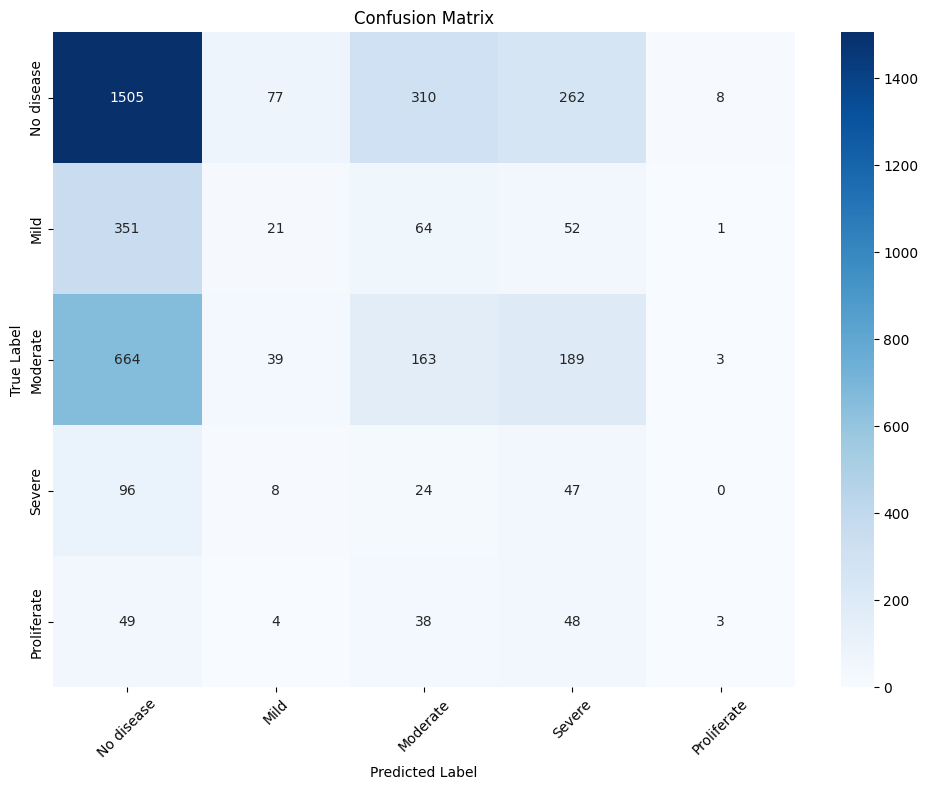

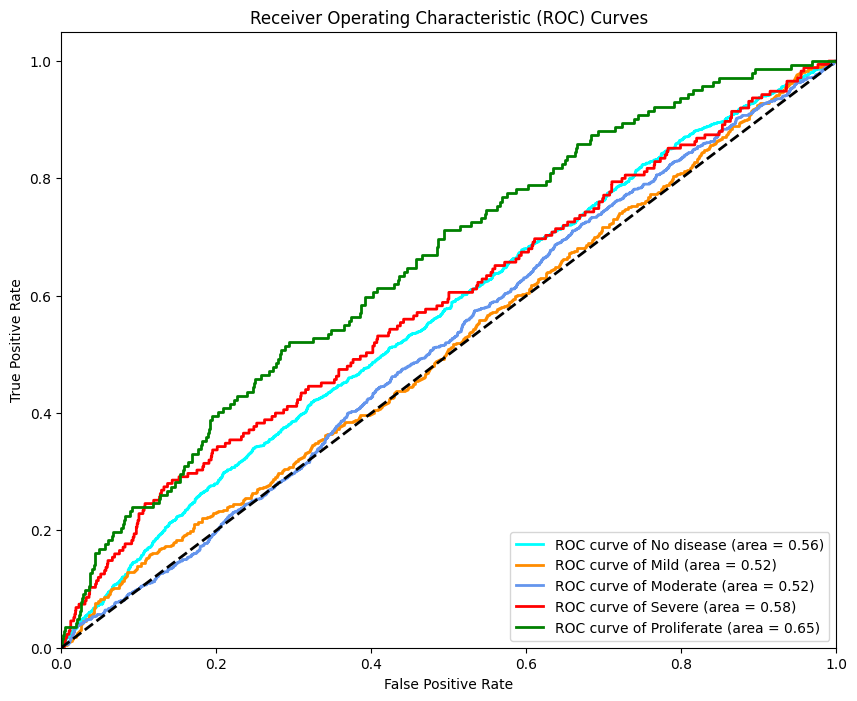


AUC Scores for each class:
No disease: 0.563
Mild: 0.515
Moderate: 0.519
Severe: 0.582
Proliferate: 0.652


In [24]:
# First import necessary metric functions
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
import seaborn as sns
from itertools import cycle

# Get predictions on validation set
y_pred_probs = model.predict(val_dataset)
y_pred = np.argmax(y_pred_probs, axis=1)

# Calculate metrics
print("\nClassification Report:")
print(classification_report(val_labels, y_pred, target_names=list(class_mapping.keys())))

# Create confusion matrix plot
plt.figure(figsize=(10, 8))
cm = confusion_matrix(val_labels, y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_mapping.keys(),
            yticklabels=class_mapping.keys())
plt.title('Confusion Matrix')
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# ROC Curves
fpr = dict()
tpr = dict()
roc_auc = dict()

y_test_bin = tf.keras.utils.to_categorical(val_labels, NUM_CLASSES)

plt.figure(figsize=(10, 8))
colors = cycle(['aqua', 'darkorange', 'cornflowerblue', 'red', 'green'])

for i, color in zip(range(NUM_CLASSES), colors):
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_pred_probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])
    
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
             label=f'ROC curve of {list(class_mapping.keys())[i]} (area = {roc_auc[i]:0.2f})')

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curves')
plt.legend(loc="lower right")
plt.show()

# Print AUC scores
print("\nAUC Scores for each class:")
for i in range(NUM_CLASSES):
    print(f"{list(class_mapping.keys())[i]}: {roc_auc[i]:.3f}")